## Step 1

In [ ]:
import pandas as pd

In [ ]:
import os

In [ ]:
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/My Drive/Kaggle"

In [ ]:
%cd /content/drive/My Drive/Kaggle

/content/drive/My Drive/Kaggle


In [ ]:
! kaggle datasets download -d joe1995/div2k-dataset

100% 3.71G/3.71G [02:04<00:00, 41.8MB/s]
100% 3.71G/3.71G [02:04<00:00, 32.1MB/s]


In [ ]:
!unzip \*.zip && rm * .zip

Archive:  div2k-dataset.zip
  inflating: DIV2K_train_HR/DIV2K_train_HR/0001.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0002.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0003.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0004.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0005.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0006.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0007.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0008.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0009.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0010.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0011.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0012.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0013.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0014.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0015.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0016.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0017.png  
  inflating: DIV2K_train_HR/DIV2K_train_HR/0018.png  


## Step 2

In [ ]:
input_img_dir = "/content/drive/My Drive/Kaggle/DIV2K_train_HR/DIV2K_train_HR"
output_dir = "/content/drive/My Drive/Kaggle/DIV2K_valid_HR/DIV2K_valid_HR"

In [ ]:
from PIL import Image
import os
import shutil

def convert_png_to_jpeg(input_dir, output_dir):
    for root, _, files in os.walk(input_dir):
        for filename in files:
            if filename.endswith(".png"):
                img_path = os.path.join(root, filename)
                img = Image.open(img_path)
                new_filename = os.path.splitext(filename)[0] + ".jpeg"
                output_folder = os.path.relpath(root, input_dir)  # Get relative path to preserve the subdirectory structure
                output_folder_path = os.path.join(output_dir, output_folder)
                output_path = os.path.join(output_folder_path, new_filename)

                if not os.path.exists(output_folder_path):
                    os.makedirs(output_folder_path)

                img = img.convert("RGB")  # Convert RGBA images to RGB format (JPEG doesn't support alpha channel)
                img.save(output_path, "JPEG", quality=95)

input_img_dir = "/content/drive/My Drive/Kaggle/DIV2K_valid_HR/DIV2K_valid_HR"
output_dir = "/content/drive/My Drive/Kaggle/DIV2K_valid_HR/DIV2K_valid_HR_JPEG_for_valid"

convert_png_to_jpeg(input_img_dir, output_dir)

In [ ]:
from PIL import Image
import os
import shutil

def convert_png_to_jpeg(input_dir, output_dir):
    for root, _, files in os.walk(input_dir):
        for filename in files:
            if filename.endswith(".png"):
                img_path = os.path.join(root, filename)
                img = Image.open(img_path)
                new_filename = os.path.splitext(filename)[0] + ".jpeg"
                output_folder = os.path.relpath(root, input_dir)  # Get relative path to preserve the subdirectory structure
                output_folder_path = os.path.join(output_dir, output_folder)
                output_path = os.path.join(output_folder_path, new_filename)

                if not os.path.exists(output_folder_path):
                    os.makedirs(output_folder_path)

                img = img.convert("RGB")  # Convert RGBA images to RGB format (JPEG doesn't support alpha channel)
                img.save(output_path, "JPEG", quality=95)

input_img_dir = "/content/drive/My Drive/Kaggle/DIV2K_train_HR/DIV2K_train_HR"
output_dir = "/content/drive/My Drive/Kaggle/DIV2K_train_HR/DIV2K_train_HR_JPEG_for_train"

convert_png_to_jpeg(input_img_dir, output_dir)

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, BatchNormalization, Activation
from tensorflow.keras.models import Model

In [ ]:
def denoising_autoencoder(input_shape):
    """
    Create a denoising autoencoder model.

    Args:
        input_shape: The shape of the input data.

    Returns:
        The denoising autoencoder model.
    """

    # Define the encoder network
    encoder = tf.keras.Sequential([
        tf.keras.layers.Input(input_shape),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.MaxPooling2D((2, 2), strides=2),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.MaxPooling2D((2, 2), strides=2),
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.MaxPooling2D((2, 2), strides=2),
        tf.keras.layers.Flatten(),
    ])

    # Define the decoder network
    decoder = tf.keras.Sequential([
        tf.keras.layers.Dense(128 * 7 * 7, activation='relu'),
        tf.keras.layers.Reshape((7, 7, 128)),
        tf.keras.layers.Conv2DTranspose(64, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.UpSampling2D((2, 2)),
        tf.keras.layers.Conv2DTranspose(32, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.UpSampling2D((2, 2)),
        tf.keras.layers.Conv2DTranspose(3, (3, 3), activation='sigmoid', padding='same'),
    ])

    # Combine the encoder and decoder networks
    model = tf.keras.Sequential([encoder, decoder])

    return model


In [ ]:
from PIL import Image
import numpy as np

def preprocess_image(image_path, target_size=(224, 224)):
    # Load image using PIL
    image = Image.open(image_path)

    # Resize the image to the target size
    image = image.resize(target_size)

    # Normalize the image to the range [0, 1] by dividing by 255.0
    image = np.array(image) / 255.0

    return image

In [ ]:
# def load_dataset(folder_path):
#     image_paths = [os.path.join(folder_path, filename) for filename in os.listdir(folder_path) if filename.endswith(".jpeg")]
#     images = [preprocess_image(image_path) for image_path in image_paths]
#     dataset = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(images))
#     return dataset


# train_folder_path = "/content/drive/My Drive/Kaggle/DIV2K_train_HR/DIV2K_train_HR_JPEG_for_train"
# valid_folder_path = "/content/drive/My Drive/Kaggle/DIV2K_valid_HR/DIV2K_valid_HR_JPEG_for_valid"

# train_dataset = load_dataset(train_folder_path)
# valid_dataset = load_dataset(valid_folder_path)

In [ ]:
import os

In [ ]:
target_size = (1404, 2040)  # Define the target size of the images

def load_dataset(folder_path, target_size):
    image_paths = [os.path.join(folder_path, filename) for filename in os.listdir(folder_path) if filename.endswith(".jpeg")]
    images = [preprocess_image(image_path, target_size) for image_path in image_paths]
    dataset = tf.data.Dataset.from_tensor_slices(tf.convert_to_tensor(images))
    return dataset

train_folder_path = "/content/drive/My Drive/Kaggle/DIV2K_train_HR/DIV2K_train_HR_JPEG_for_train"
valid_folder_path = "/content/drive/My Drive/Kaggle/DIV2K_valid_HR/DIV2K_valid_HR_JPEG_for_valid"

train_dataset = load_dataset(train_folder_path, target_size)
valid_dataset = load_dataset(valid_folder_path, target_size)


In [ ]:
from PIL import Image

import cv2

def get_image_dimensions(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (1404, 2040))
    width, height, num_channels = image.shape
    return height, width, num_channels


# Example usage to get dimensions of the first image in the train dataset
train_folder_path = "/content/drive/My Drive/Kaggle/DIV2K_train_HR/DIV2K_train_HR_JPEG_for_train"
image_paths = [os.path.join(train_folder_path, filename) for filename in os.listdir(train_folder_path) if filename.endswith(".jpeg")]

if len(image_paths) > 0:
    first_image_path = image_paths[0]
    image_height, image_width, num_channels = get_image_dimensions(first_image_path)
    print("Image Height:", image_height)
    print("Image Width:", image_width)
    print("Number of Channels:", num_channels)
else:
    print("No images found in the train dataset.")

In [ ]:
input_shape = (1404, 2040, 3)  # Replace these values with your actual image dimensions
autoencoder_model = denoising_autoencoder(input_shape)
autoencoder_model.compile(optimizer='adam', loss='mean_squared_error')

In [ ]:
epochs = 10  # Adjust the number of epochs as needed
autoencoder_model.fit(train_dataset, epochs=epochs)

# Import Libraires

In [ ]:
import numpy as np
import tensorflow as tf
import cv2
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import img_to_array
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt


# Load Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# to get the files in proper order
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 256
high_img = []
path = '/content/drive/MyDrive/Kaggle/DIV2K_train_HR/DIV2K_train_HR'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '855.jpg':
        break
    else:
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = '/content/drive/MyDrive/Kaggle/DIV2K_train_HR/DIV2K_train_HR_JPEG_for_train'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
     if i == '855.jpg':
        break
     else:
        img = cv2.imread(path + '/'+i,1)

        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        low_img.append(img_to_array(img))

100%|██████████| 800/800 [00:59<00:00, 13.48it/s]


In [ ]:
# For Validation
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
SIZE = 256
high_img2 = []
path = '/content/drive/MyDrive/Kaggle/DIV2K_valid_HR/DIV2K_valid_HR'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '855.jpg':
        break
    else:
        img = cv2.imread(path + '/'+i,1)
        # code to let open cv read image in BGR format later which can be converted to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img2.append(img_to_array(img))


low_img2 = []
path = '/content/drive/MyDrive/Kaggle/DIV2K_valid_HR/DIV2K_valid_HR_JPEG_for_valid'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
     if i == '855.jpg':
        break
     else:
        img = cv2.imread(path + '/'+i,1)
        #resizing
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        low_img2.append(img_to_array(img))

100%|██████████| 100/100 [00:07<00:00, 13.49it/s]


# Data Visualization

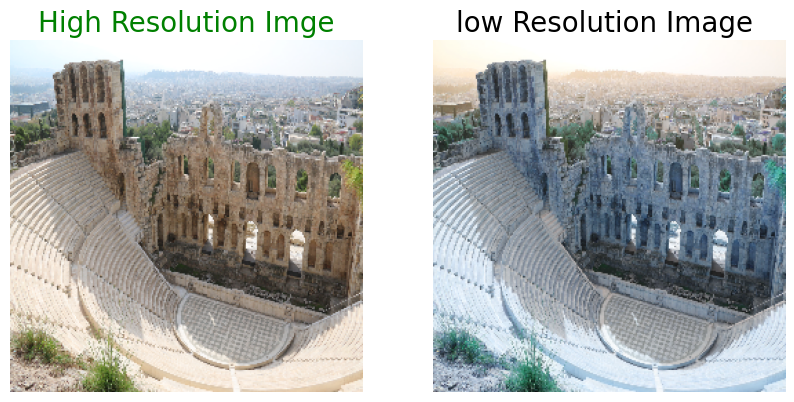

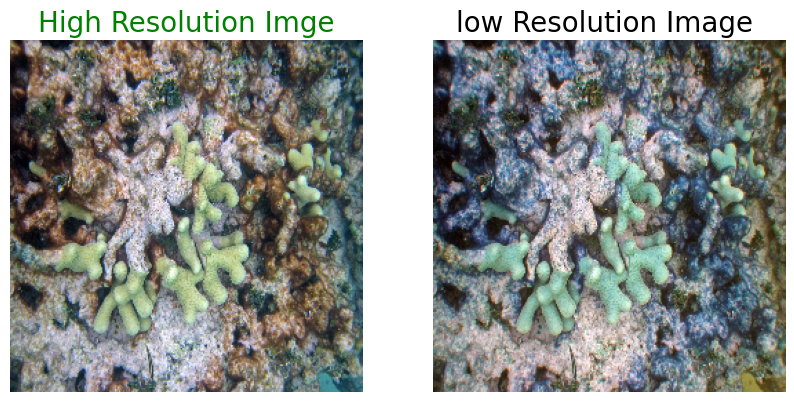

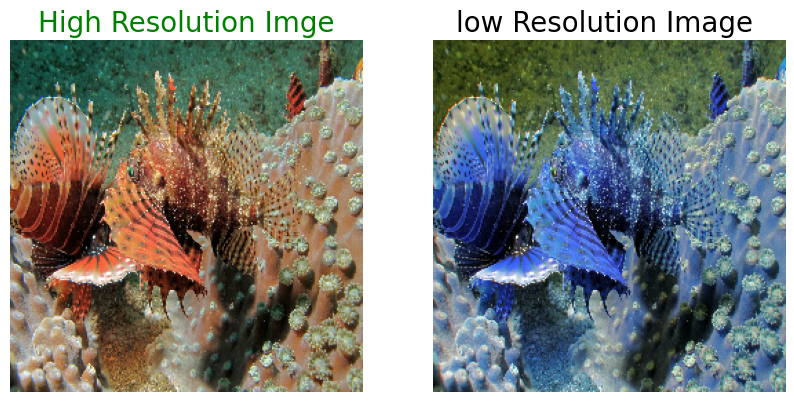

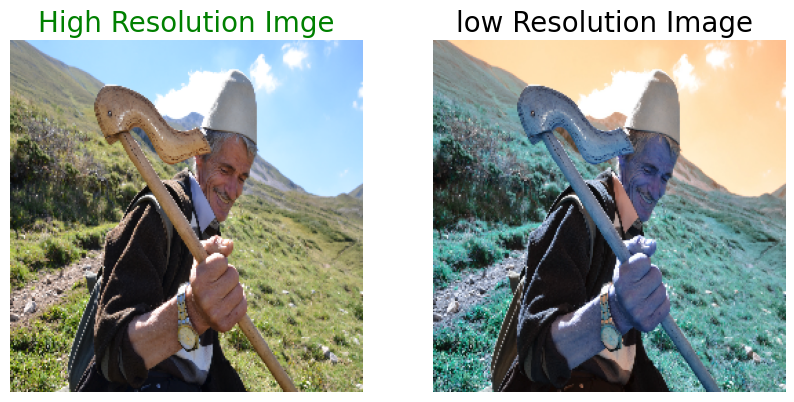

In [ ]:
for i in range(4):
    a = np.random.randint(0,800)
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.title('High Resolution Imge', color = 'green', fontsize = 20)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 20)
    plt.imshow(low_img[a])
    plt.axis('off')

# Slicing and Reshaping Images

In [ ]:
train_high_image = high_img[:700]
train_low_image = low_img[:700]
train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

validation_high_image = high_img2[:100]
validation_low_image = low_img2[:100]
validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


test_high_image = high_img[700:]
test_low_image = low_img[700:]
test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

print("Shape of training images:",train_high_image.shape)
print("Shape of test images:",test_high_image.shape)
print("Shape of validation images:",validation_high_image.shape)

Shape of training images: (700, 256, 256, 3)
Shape of test images: (100, 256, 256, 3)
Shape of validation images: (100, 256, 256, 3)


# Defining Model

In [ ]:
from tensorflow import keras

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 128, 128, 12  3584        ['input_1[0][0]']                
                                8)                                                                
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  147584      ['sequential[0][0]']             
                                                                                              

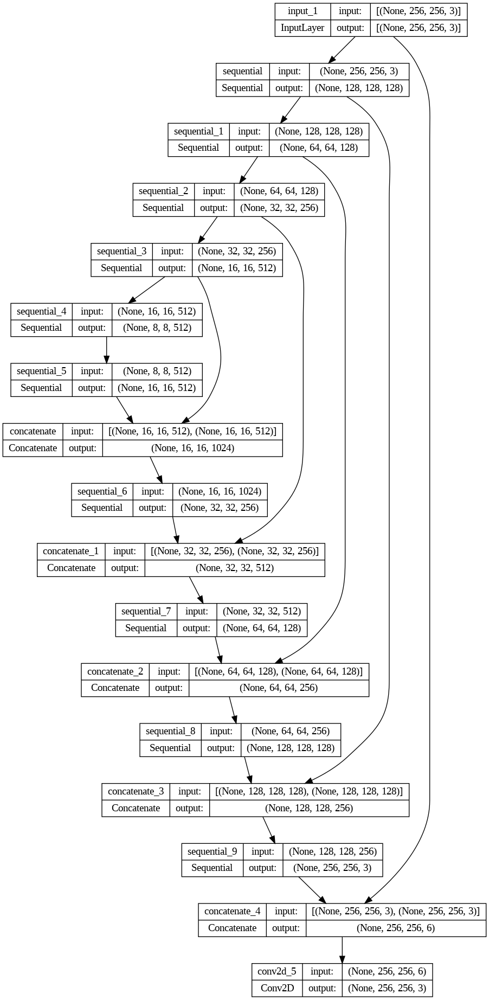

In [ ]:
from keras import layers
from keras.utils import plot_model
def down(filters , kernel_size, apply_batch_normalization = True):
    downsample = tf.keras.models.Sequential()
    downsample.add(layers.Conv2D(filters,kernel_size,padding = 'same', strides = 2))
    if apply_batch_normalization:
        downsample.add(layers.BatchNormalization())
    downsample.add(keras.layers.LeakyReLU())
    return downsample


def up(filters, kernel_size, dropout = False):
    upsample = tf.keras.models.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_size,padding = 'same', strides = 2))
    if dropout:
        upsample.dropout(0.2)
    upsample.add(keras.layers.LeakyReLU())
    return upsample

def model():
    inputs = layers.Input(shape= [SIZE,SIZE,3])
    d1 = down(128,(3,3),False)(inputs)
    d2 = down(128,(3,3),False)(d1)
    d3 = down(256,(3,3),True)(d2)
    d4 = down(512,(3,3),True)(d3)

    d5 = down(512,(3,3),True)(d4)
    #upsampling
    u1 = up(512,(3,3),False)(d5)
    u1 = layers.concatenate([u1,d4])
    u2 = up(256,(3,3),False)(u1)
    u2 = layers.concatenate([u2,d3])
    u3 = up(128,(3,3),False)(u2)
    u3 = layers.concatenate([u3,d2])
    u4 = up(128,(3,3),False)(u3)
    u4 = layers.concatenate([u4,d1])
    u5 = up(3,(3,3),False)(u4)
    u5 = layers.concatenate([u5,inputs])
    output = layers.Conv2D(3,(2,2),strides = 1, padding = 'same')(u5)
    return tf.keras.Model(inputs=inputs, outputs=output)

model = model()
model.summary()
plot_model(model, to_file ='super_res.png',show_shapes=True)

# Compile

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mean_absolute_error',
              metrics = ['acc'])

# Fitting model

In [ ]:
model.fit(train_low_image, train_high_image, epochs = 7, batch_size = 1,
          validation_data = (validation_low_image,validation_high_image))

Epoch 1/7
700/700 [==============================] - 31s 21ms/step - loss: 0.0743 - acc: 0.6374 - val_loss: 0.0376 - val_acc: 0.7531
Epoch 2/7
700/700 [==============================] - 15s 21ms/step - loss: 0.0255 - acc: 0.8146 - val_loss: 0.0199 - val_acc: 0.8223
Epoch 3/7
700/700 [==============================] - 15s 21ms/step - loss: 0.0168 - acc: 0.8635 - val_loss: 0.0135 - val_acc: 0.8781
Epoch 4/7
700/700 [==============================] - 15s 21ms/step - loss: 0.0138 - acc: 0.8793 - val_loss: 0.0119 - val_acc: 0.8821
Epoch 5/7
700/700 [==============================] - 16s 22ms/step - loss: 0.0115 - acc: 0.8955 - val_loss: 0.0138 - val_acc: 0.8444
Epoch 6/7
700/700 [==============================] - 16s 23ms/step - loss: 0.0103 - acc: 0.9022 - val_loss: 0.0092 - val_acc: 0.8911
Epoch 7/7
700/700 [==============================] - 15s 22ms/step - loss: 0.0095 - acc: 0.9076 - val_loss: 0.0094 - val_acc: 0.9024


# Prediction Visualization

1/1 [==============================] - 0s 349ms/step


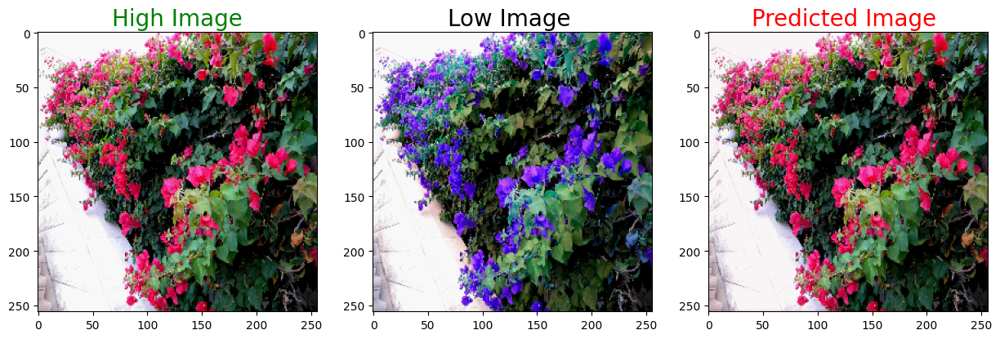

1/1 [==============================] - 0s 42ms/step


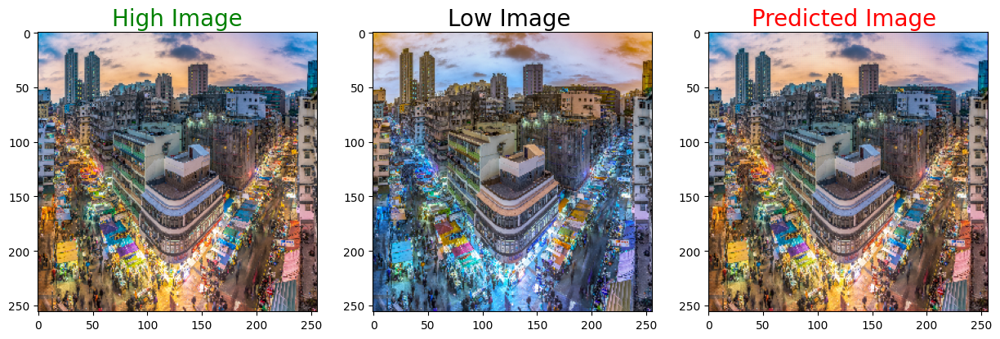

1/1 [==============================] - 0s 29ms/step


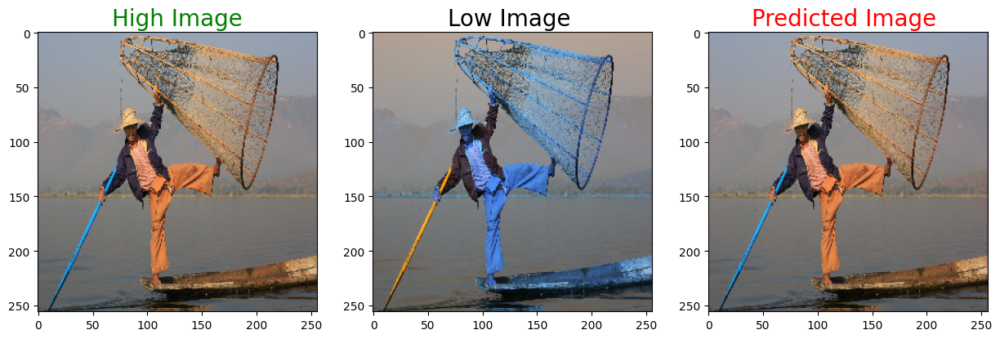

1/1 [==============================] - 0s 29ms/step


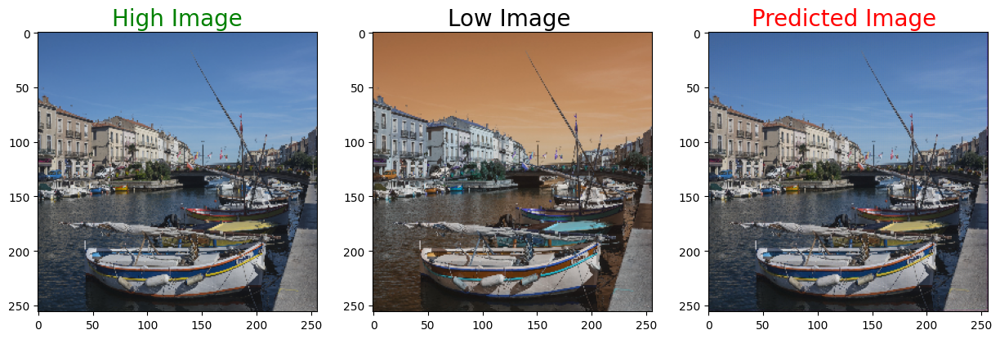

1/1 [==============================] - 0s 55ms/step


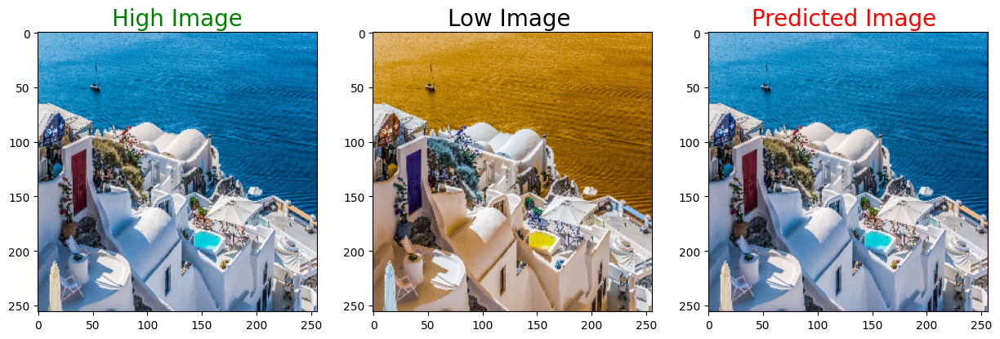

1/1 [==============================] - 0s 36ms/step


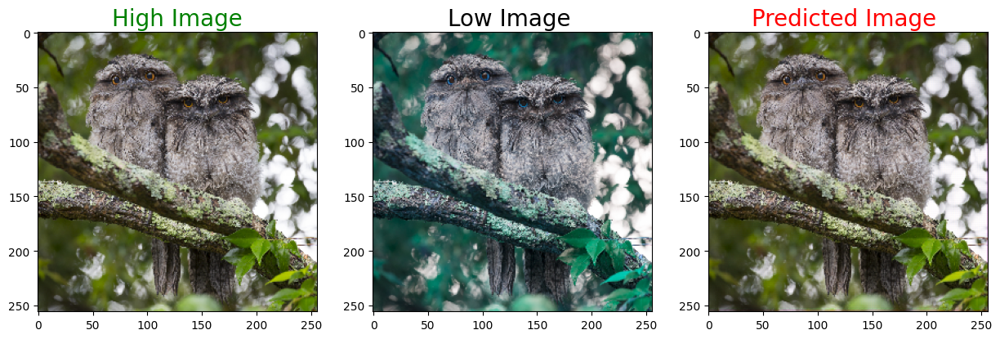

1/1 [==============================] - 0s 45ms/step


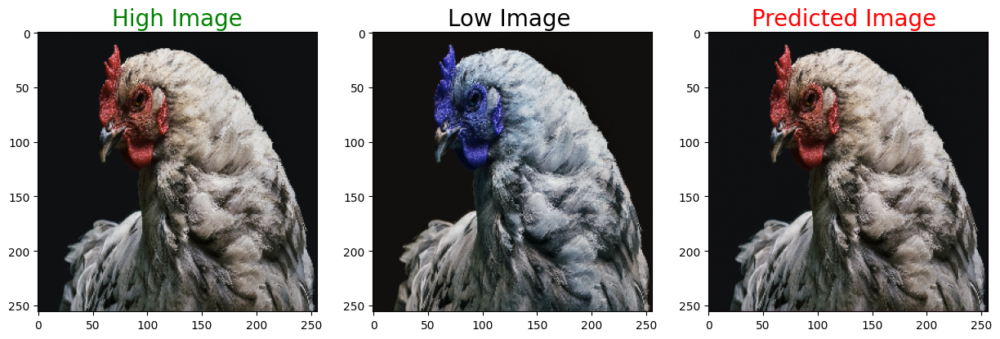

1/1 [==============================] - 0s 34ms/step


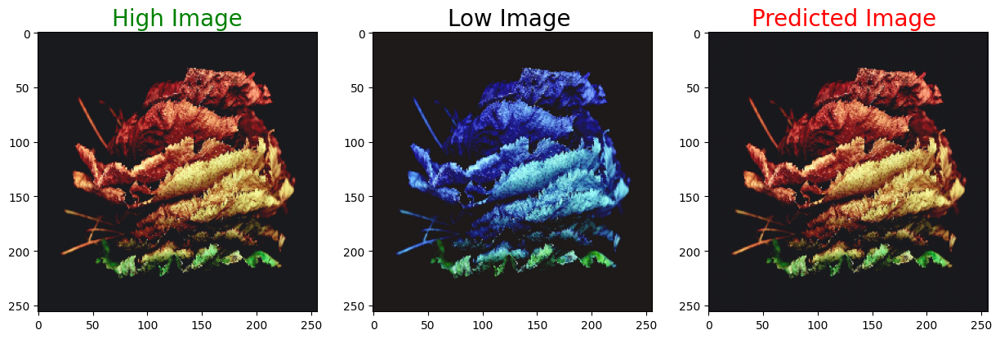

1/1 [==============================] - 0s 29ms/step


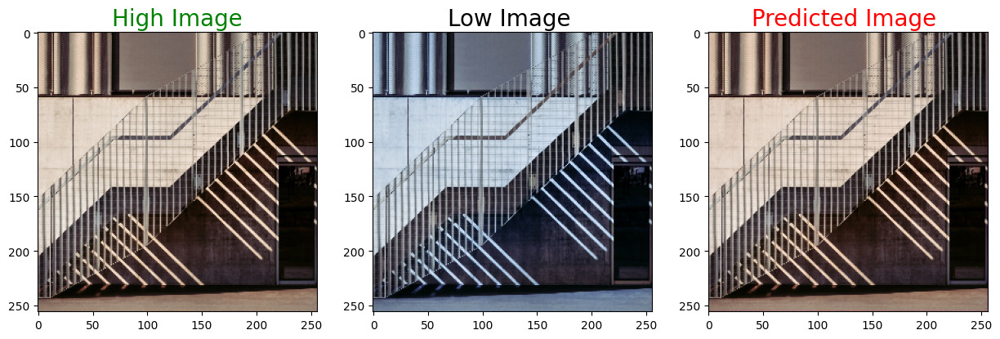

1/1 [==============================] - 0s 36ms/step


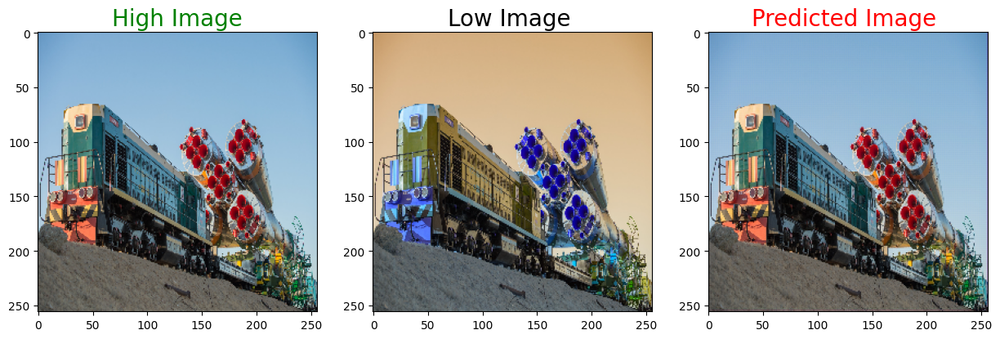

In [ ]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Image', color = 'green', fontsize = 20)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Low Image ', color = 'black', fontsize = 20)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)

    plt.show()

for i in range(10,20):

    predicted = np.clip(model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)

In [ ]:
model.save("final_model.h5")

##Test

In [ ]:
import cv2
import numpy as np
from PIL import Image
import tensorflow as tf
from google.colab import files
from io import BytesIO

# Load model
model = tf.keras.models.load_model('final_model.h5')

# Allow image upload
uploaded = files.upload()

# Get uploaded file
file = next(iter(uploaded.values()))

# Decode PNG using OpenCV
img = cv2.imdecode(np.frombuffer(file, np.uint8), cv2.IMREAD_UNCHANGED)

# Convert OpenCV image to PIL
img = Image.fromarray(img)

# Handle grayscale
if img.mode != 'RGB':
    img = img.convert('RGB')

# Remove alpha channel
if img.mode == 'RGBA':
    img = img.convert('RGB')

# Resize
img = img.resize((256, 256))

# Convert PIL Image to numpy array
img = np.array(img)

# Normalize
img = img / 255.0

# Add batch dimension
img = np.expand_dims(img, axis=0)

# Generate super resolution image
sr_img = model.predict(img)

# Remove batch dimension
sr_img = sr_img.reshape(256, 256, 3)

# Save image
from skimage.io import imsave
imsave('super2_res.png', sr_img)

print('Super resolution image saved!')

Saving test_image_6.png to test_image_6.png
1/1 [==============================] - 0s 208ms/step


Super resolution image saved!
